# Semantic Segmentation with Deep Learning: Training and Testing on Colab

If you're running this on Colab, insert the following Javascript snippet into your browser console so that your Colab runtime won't time out. Open developer-settings (in your web-browser) with Ctrl+Shift+I then click on console tab and type this on the console prompt. (for mac press Option+Command+I)

(You can ignore this if you manually click connect button.)
```Javascript
function ClickConnect(){
    console.log("Clicked on connect button"); 
    document.querySelector("colab-connect-button").click()
}
setInterval(ClickConnect,60000)
```

Zip up your code locally with `python zip_for_colab.py`, and upload your `cv_proj4_colab.zip` file to Google Drive. Upload this ipynb file to Colab and open this file. Hit refresh, then run the following:

In [1]:
import os
# If you're running on Colab, leave this as True. If you're running locally, set this to false
use_colab = False
if use_colab:
    from google.colab import drive
    # This block of code mounts your Google Drive to the Colab notebook. 
    # The zip file containing the project will be loaded from your Google Drive.
    drive.mount('/content/drive')
    # Replace with the path to your folder
    folder_path = '/content/drive/MyDrive/__folder_of_cv_proj4_colab.zip_in_Google_Drive__'
    os.chdir(folder_path)

Unzip your `cv_proj4_colab.zip` to folder `cv_proj4`

In [2]:
if use_colab:
    !unzip cv_proj4_colab.zip -d cv_proj4

Change working directory to `cv_proj4` and install the `proj4_code` module locally:

In [3]:
if use_colab:
    proj_path = '/content/drive/MyDrive/__folder_of_cv_proj4_colab.zip_in_Google_Drive__/cv_proj4'
    os.chdir(proj_path)

In [4]:
if use_colab:
    !ls
    !pip install -e .

In [5]:
import torch
device = torch.device('cpu')
# If you have an NVIDIA GPU with at least 8 GB of VRAM and you are running locally, set this to True
use_cuda = True
if torch.cuda.is_available():
    if use_cuda or use_colab:
        device = torch.device('cuda')
        print("CUDA-compatible NVIDIA GPU enabled.")
    else:
        print("CUDA-compatible NVIDIA GPU detected. Consider setting use_cuda to True.")
if device.type == 'cpu':
    if use_colab:
        raise Exception("No GPU was detected on this Colab instance. Check to make sure the runtime type is set to GPU.")
    else:
        print("Warning: the configured accelerator is set to CPU-only. This will work, but will be very slow. Consider using Colab, or if a GPU was detected above, consider enabling it.")

print("Using device: %s" % str(device))

CUDA-compatible NVIDIA GPU enabled.
Using device: cuda


Download ImageNet-pretrained ResNet-50. The following two cells will automatically do this on Colab, or locally on Mac and Linux. If you are working locally on Windows, download the file directly from [here](https://docs.google.com/uc?export=download&id=1w5pRmLJXvmQQA5PtCbHhZc_uC4o0YbmA). Place it in a folder named `initmodel`.

In [6]:
# If you're using MacOS, uncomment the following line:
# !mamba install conda-forge::wget -y
!wget -O "resnet50_v2.pth" --no-check-certificate 'https://static.kirijo.group/resnet50_v2.pth'
!mkdir initmodel && mv resnet50_v2.pth initmodel/

--2025-10-29 15:32:54--  https://static.kirijo.group/resnet50_v2.pth
Resolving static.kirijo.group (static.kirijo.group)... 76.141.88.98, 2601:249:1900:1ba1:e2d5:5eff:fef5:d92b
Connecting to static.kirijo.group (static.kirijo.group)|76.141.88.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102976423 (98M) [application/octet-stream]
Saving to: ‘resnet50_v2.pth’

resnet50_v2.pth     100%[===================>]  98.21M  27.6MB/s    in 4.0s    

2025-10-29 15:32:58 (24.7 MB/s) - ‘resnet50_v2.pth’ saved [102976423/102976423]

mkdir: cannot create directory ‘initmodel’: File exists


In [7]:
# The ImageNet-pretrained ResNet-50 weights should be 99 MB
!ls -ltrh initmodel

total 99M
-rw-r--r--. 1 ayamamura6 gtperson 99M Nov 16  2024 resnet50_v2.pth


Download the Camvid dataset images. It's 700 MB, but it should only take 30 sec. The following two cells will automatically do this on Colab, or locally on Mac and Linux. If you are working locally on Windows, download the file directly from [here](https://github.com/johnwlambert/camvid-dataset-mirror/releases/download/v1.0.0/701_StillsRaw_full.zip) and place the contents under the `Camvid` directory. You should then have a folder called `701_StillsRaw_full` under `Camvid`.

In [8]:
# !chmod +rwx download_dataset.sh
# !sed -i -e 's/\r$//' download_dataset.sh
# !./download_dataset.sh Camvid

In [9]:
# !ls
# !cd Camvid && unzip camvid_semseg11.zip && cd ..

We'll now set some default hyperparameters for training. Choose the number of epochs you'd like to train for (for PSPNet, it will take ~30 min for 50 epochs, or ~70 min for 100 epochs).

In [10]:
!python --version
from types import SimpleNamespace

args = SimpleNamespace(
    **{
        # DEVICE
        "device": device,
        # DATA
        "names_path": "./dataset_lists/camvid-11/camvid-11_names.txt",
        "data_root": "./Camvid/",
        "train_list": "./src/dataset_lists/camvid-11/list/train.txt",  
        "val_list": "./src/dataset_lists/camvid-11/list/val.txt",
        "classes": 11,
        # TRAIN
        "arch": "PSPNet", #  "SimpleSegmentationNet", # 
        # "arch": "SimpleSegmentationNet", 
        "save_path": "",
        "epochs": 50,
        "zoom_factor": 8,
        "use_ppm": True,
        # "use_ppm": False,
        "aux_weight": 0.4,
        # "aux_loss": True,
        "aux_loss": False,
        "layers": 50,
        "workers": 2,
        "batch_size": 32,
        "batch_size_val": 32,
        "data_aug": True,
        # "data_aug": False,
        "short_size": 240,
        "train_h": 201,
        "train_w": 201,
        "init_weight": "./initmodel/resnet50_v2.pth",
        "scale_min": 0.5,  # minimum random scale
        "scale_max": 2.0,  # maximum random scale
        "rotate_min": -10,  # minimum random rotate
        "rotate_max": 10,  # maximum random rotate
        "ignore_label": 255,
        "base_lr": 0.01,
        "start_epoch": 0,
        "power": 0.9,
        "momentum": 0.9,
        "weight_decay": 0.0001,
        "manual_seed": 0,
        "print_freq": 10,
        "save_freq": 1,
        "evaluate": True,  # evaluate on validation set, extra gpu memory needed and small batch_size_val is recommend
        "multiprocessing_distributed": False,
        # INFERENCE
        "dataset": "camvid-11",
        "base_size": 240,
        "test_h": 201,
        "test_w": 201,
        "scales": [1.0], # [0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        "test_list": "./src/dataset_lists/camvid-11/list/val.txt",
        "vis_freq": 10,
        "pretrained": True
        # "pretrained": False
    }
)

args.save_path = f"exp/camvid/{args.arch}/model"

Python 3.11.0


In [11]:
import os

import torch

os.makedirs(args.save_path, exist_ok=True)
from vision.trainer import main_worker
print(args)
main_worker(args, device)

namespace(device=device(type='cuda'), names_path='./dataset_lists/camvid-11/camvid-11_names.txt', data_root='./Camvid/', train_list='./src/dataset_lists/camvid-11/list/train.txt', val_list='./src/dataset_lists/camvid-11/list/val.txt', classes=11, arch='PSPNet', save_path='exp/camvid/PSPNet/model', epochs=50, zoom_factor=8, use_ppm=True, aux_weight=0.4, aux_loss=False, layers=50, workers=2, batch_size=32, batch_size_val=32, data_aug=True, short_size=240, train_h=201, train_w=201, init_weight='./initmodel/resnet50_v2.pth', scale_min=0.5, scale_max=2.0, rotate_min=-10, rotate_max=10, ignore_label=255, base_lr=0.01, start_epoch=0, power=0.9, momentum=0.9, weight_decay=0.0001, manual_seed=0, print_freq=10, save_freq=1, evaluate=True, multiprocessing_distributed=False, dataset='camvid-11', base_size=240, test_h=201, test_w=201, scales=[1.0], test_list='./src/dataset_lists/camvid-11/list/val.txt', vis_freq=10, pretrained=True)
namespace(device=device(type='cuda'), names_path='./dataset_lists/

We'll now create full-resolution predictions for the full val set, and compute mIoU against the ground truth.

In [12]:
from vision.test import test_model
args.model_path = f"exp/camvid/{args.arch}/model/train_epoch_{args.epochs}.pth"
test_model(args)

[2025-10-29 15:42:20,881 INFO test.py line 279 3509137] => loading checkpoint 'exp/camvid/PSPNet/model/train_epoch_50.pth'
[2025-10-29 15:42:21,188 INFO test.py line 282 3509137] => loaded checkpoint 'exp/camvid/PSPNet/model/train_epoch_50.pth'
[2025-10-29 15:42:21,251 INFO test.py line 294 3509137] >>>>>>>>>>>>>> Start inference task >>>>>>>>>>>>>
List of (image,label) pairs test list generated!
[2025-10-29 15:42:21,451 INFO test.py line 399 3509137] On image 0
[2025-10-29 15:42:21,466 INFO test.py line 399 3509137] On image 1
[2025-10-29 15:42:21,478 INFO test.py line 399 3509137] On image 2
[2025-10-29 15:42:21,507 INFO test.py line 399 3509137] On image 3
[2025-10-29 15:42:21,525 INFO test.py line 399 3509137] On image 4
[2025-10-29 15:42:21,556 INFO test.py line 399 3509137] On image 5
[2025-10-29 15:42:21,571 INFO test.py line 399 3509137] On image 6
[2025-10-29 15:42:21,607 INFO test.py line 399 3509137] On image 7
[2025-10-29 15:42:21,619 INFO test.py line 399 3509137] On image

**Important**: Record the mIoU listed in the output above, and the IoU per each class. You can find the results later in `train_epoch_{args.epochs}/camvid-11/720/results.txt`.

Now, let's take a look at what our results look like. We'll make a 2x3 image grid with the following structure:

|RGB Image | Blended RGB and Ground Truth | Ground Truth 
|:-: | :-: | :-:
| RGB Image | Blended RGB and Prediction | Prediction

/tmp/ipykernel_3509137/2526920291.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')


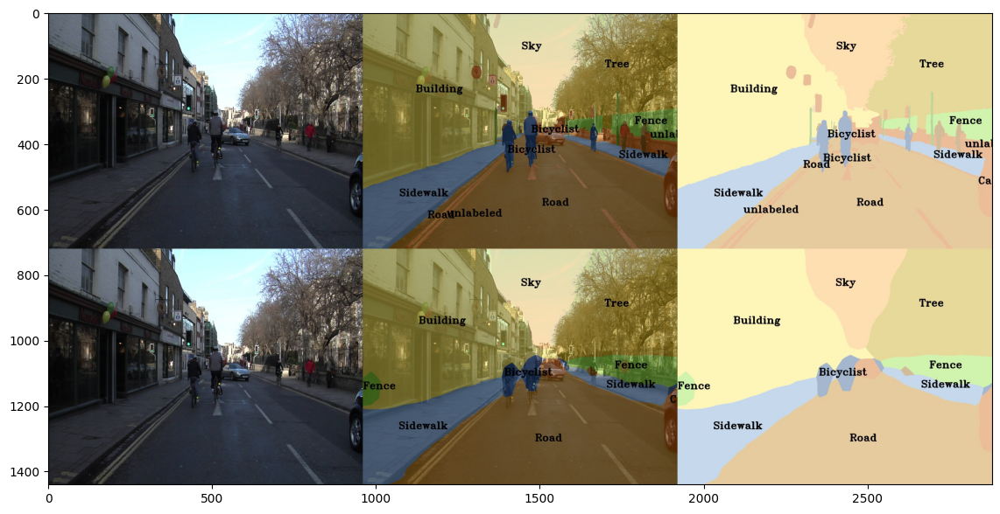

In [13]:
import imageio
import matplotlib.pyplot as plt

rgb_predictions_dir = f"train_epoch_{args.epochs}/camvid-11/{args.base_size}/rgb_mask_predictions"

def show_image_grid(rgb_predictions_dir: str, img_fname: str) -> None:
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')
  plt.figure(figsize=(15,7))
  plt.imshow(img_grid)
  plt.show()

show_image_grid(rgb_predictions_dir, "0016E5_07977.jpg")

We'll look at more examples:

/tmp/ipykernel_3509137/2526920291.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_grid = imageio.imread(f'{rgb_predictions_dir}/{img_fname}')


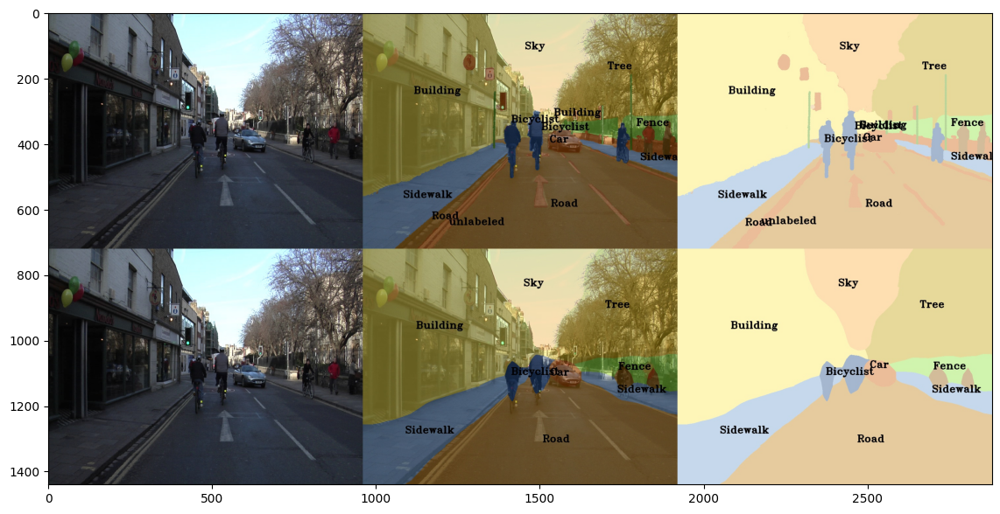

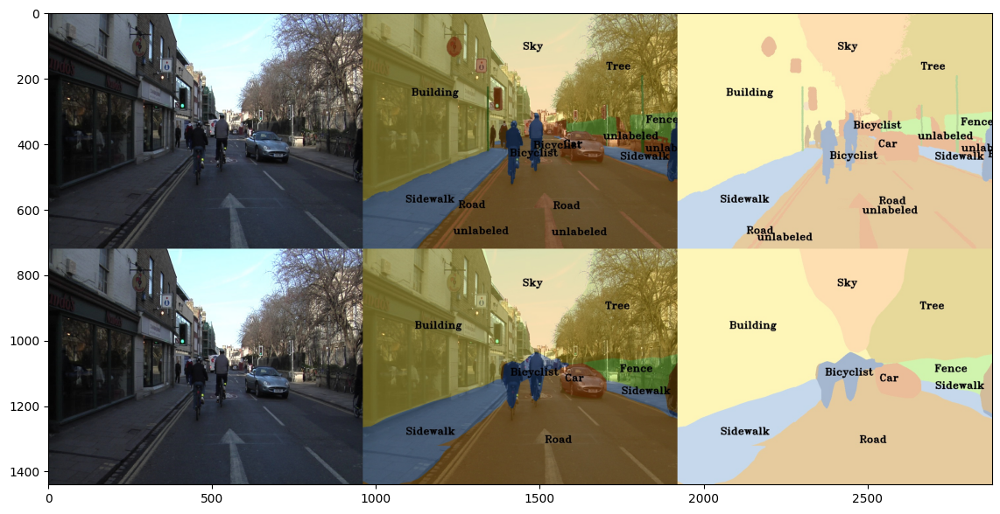

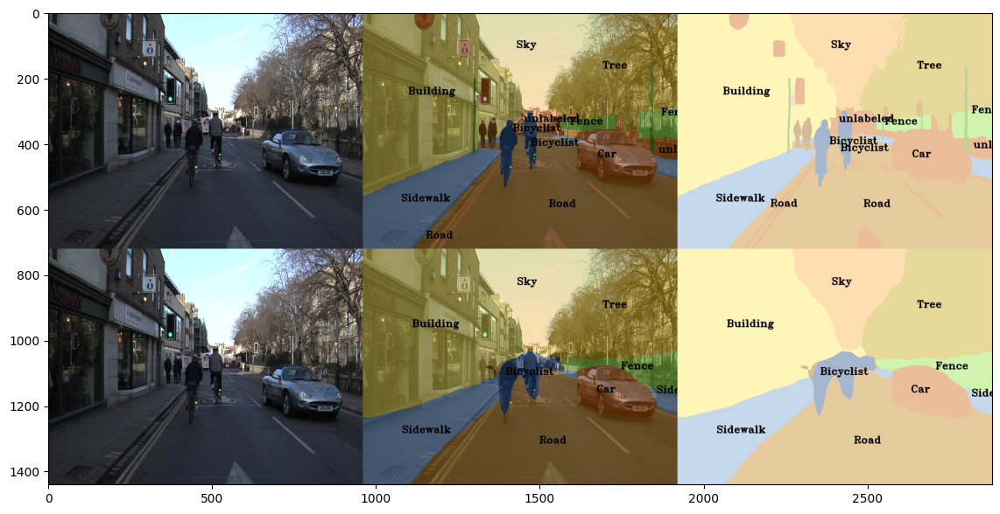

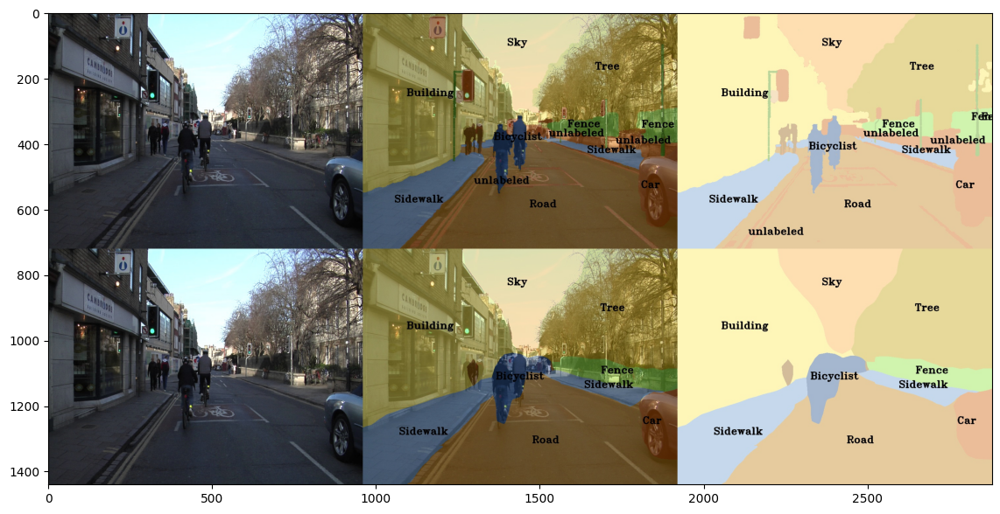

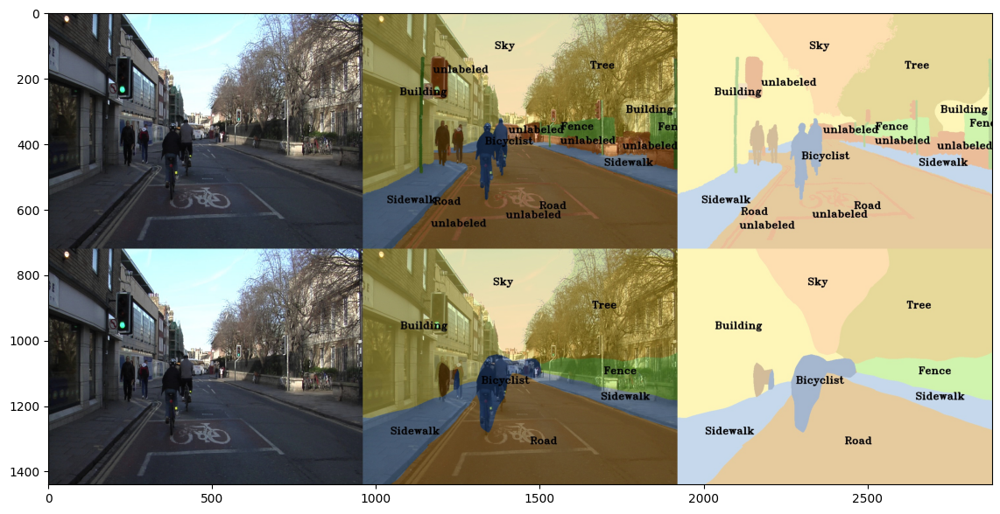

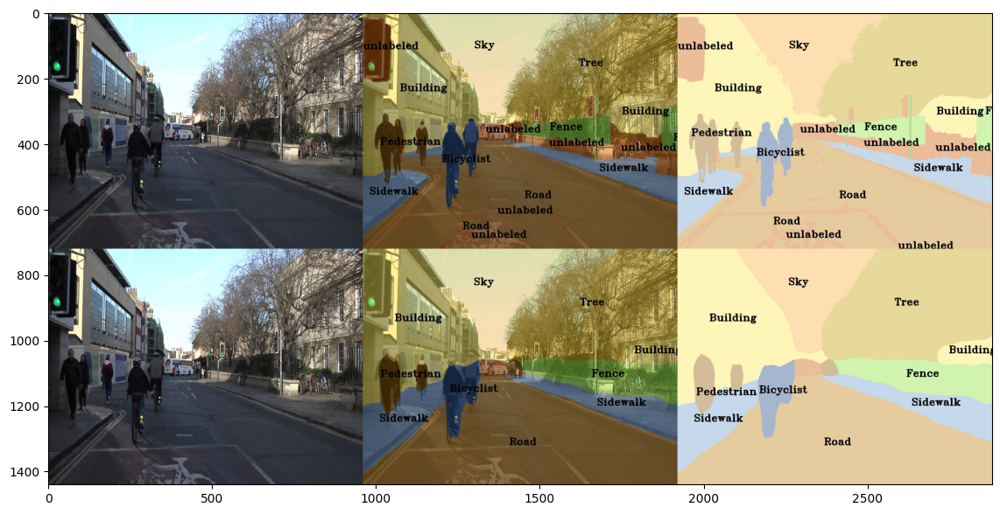

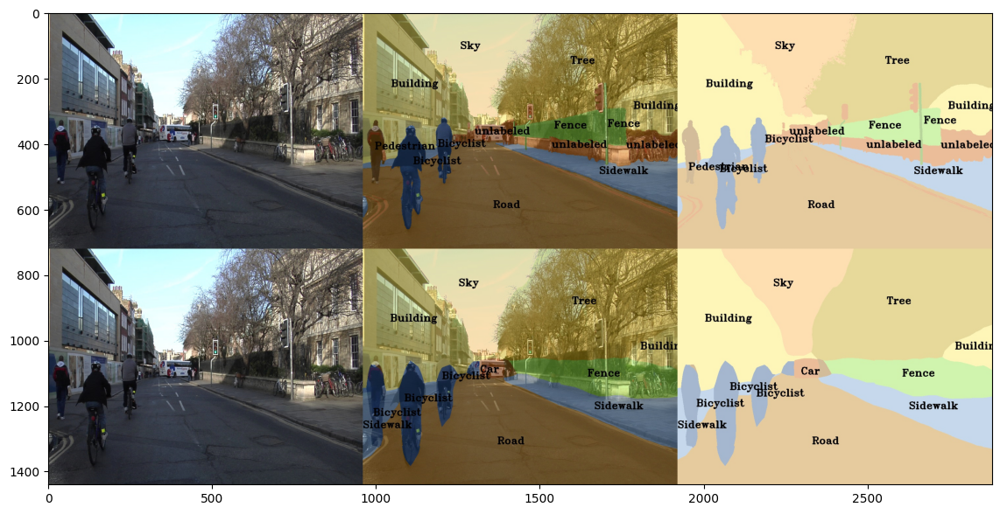

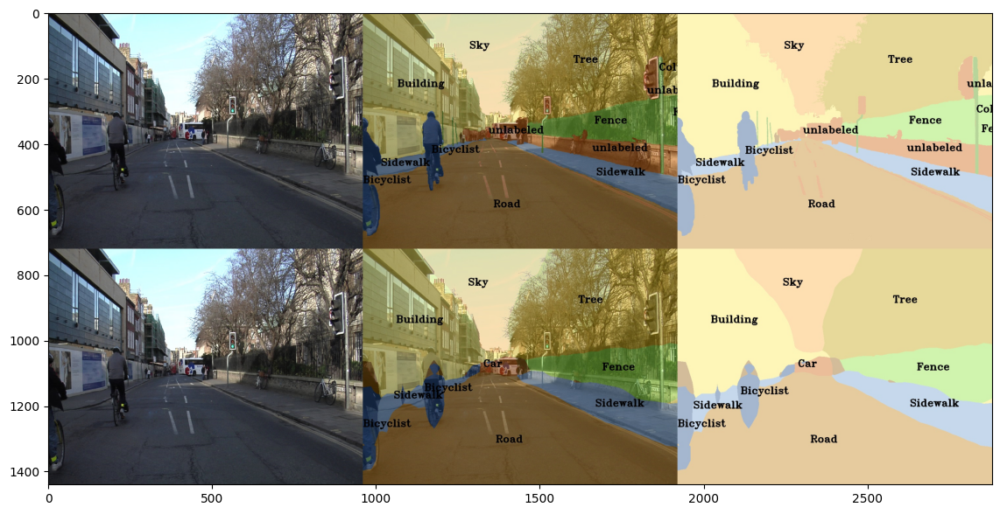

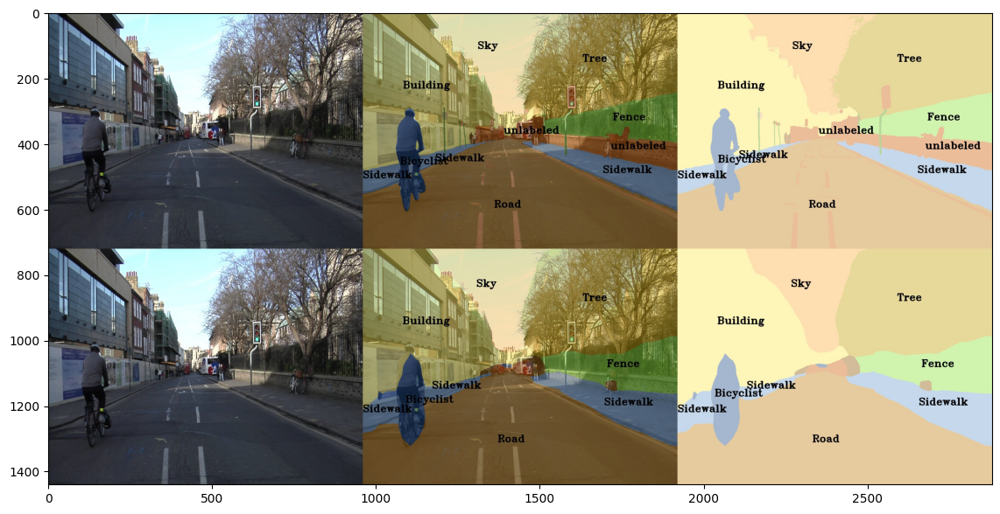

In [14]:
show_image_grid(rgb_predictions_dir, "0016E5_07997.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08017.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08037.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08057.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08077.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08097.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08117.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08137.jpg")
show_image_grid(rgb_predictions_dir, "0016E5_08157.jpg")

Now, zip up your predictions on the test set for your best model, **download them locally to your machine**, and submit these to Gradescope. The following cell will automatically zip up the predictions for you if you are on Colab or working locally on Mac or Linux. If you are on Colab, you will need to download them afterwards. If you are working locally on Windows, you will need to manually zip the directory pointed to in the `grayscale_predictions_dir` variable below.

In [15]:
grayscale_predictions_dir = f"train_epoch_{args.epochs}/camvid-11/{args.base_size}/gray"
!ls -ltrh $grayscale_predictions_dir
!zip -r grayscale_predictions.zip $grayscale_predictions_dir
!ls -ltrh grayscale_predictions.zip

total 880K
-rw-r--r--. 1 ayamamura6 gtperson 6.8K Oct 28 22:58 0016E5_07971.png
-rw-r--r--. 1 ayamamura6 gtperson 6.6K Oct 28 22:58 0016E5_07969.png
-rw-r--r--. 1 ayamamura6 gtperson 6.6K Oct 28 22:58 0016E5_07967.png
-rw-r--r--. 1 ayamamura6 gtperson 6.6K Oct 28 22:58 0016E5_07965.png
-rw-r--r--. 1 ayamamura6 gtperson 6.8K Oct 28 22:58 0016E5_07963.png
-rw-r--r--. 1 ayamamura6 gtperson 6.9K Oct 28 22:58 0016E5_07961.png
-rw-r--r--. 1 ayamamura6 gtperson 7.1K Oct 28 22:58 0016E5_07959.png
-rw-r--r--. 1 ayamamura6 gtperson 6.8K Oct 28 22:58 0016E5_07991.png
-rw-r--r--. 1 ayamamura6 gtperson 6.9K Oct 28 22:58 0016E5_07989.png
-rw-r--r--. 1 ayamamura6 gtperson 6.9K Oct 28 22:58 0016E5_07987.png
-rw-r--r--. 1 ayamamura6 gtperson 6.8K Oct 28 22:58 0016E5_07985.png
-rw-r--r--. 1 ayamamura6 gtperson 6.8K Oct 28 22:58 0016E5_07983.png
-rw-r--r--. 1 ayamamura6 gtperson 6.9K Oct 28 22:58 0016E5_07981.png
-rw-r--r--. 1 ayamamura6 gtperson 6.8K Oct 28 22:58 0016E5_07979.png
-rw-r--r--. 1 ayamamura

In this section you will load the model trained on the Camvid-11 dataset and train it on the Kitti Road Segmentation dataset.

In [16]:
args.model_path = f"exp/camvid/{args.arch}/model/train_epoch_{args.epochs}.pth"
args.data_root = "./kitti"
args.classes = 2
args.save_path = f"exp/kitti/{args.arch}/model/kitti_result"
args.batch_size = 32
args.batch_size_val = 1
args.dataset = "kitti"
args.evaluate = False
args.epochs = 20

import os

import torch
os.makedirs(args.save_path, exist_ok=True)
print(args)

namespace(device=device(type='cuda'), names_path='./dataset_lists/camvid-11/camvid-11_names.txt', data_root='./kitti', train_list='./src/dataset_lists/camvid-11/list/train.txt', val_list='./src/dataset_lists/camvid-11/list/val.txt', classes=2, arch='PSPNet', save_path='exp/kitti/PSPNet/model/kitti_result', epochs=20, zoom_factor=8, use_ppm=True, aux_weight=0.4, aux_loss=False, layers=50, workers=2, batch_size=32, batch_size_val=1, data_aug=True, short_size=240, train_h=201, train_w=201, init_weight='./initmodel/resnet50_v2.pth', scale_min=0.5, scale_max=2.0, rotate_min=-10, rotate_max=10, ignore_label=255, base_lr=0.01, start_epoch=0, power=0.9, momentum=0.9, weight_decay=0.0001, manual_seed=0, print_freq=10, save_freq=1, evaluate=False, multiprocessing_distributed=False, dataset='kitti', base_size=240, test_h=201, test_w=201, scales=[1.0], test_list='./src/dataset_lists/camvid-11/list/val.txt', vis_freq=10, pretrained=True, model_path='exp/camvid/PSPNet/model/train_epoch_50.pth', spli

In [17]:
args.base_lr = 0.01
args.momentum = 0.9
args.weight_decay = 0.0001

In [18]:
from src.vision.trainer import transfer_train
transfer_train(args, device)

[2025-10-29 15:43:01,868 INFO part6_transfer_learning.py line 52 3509137] => loading checkpoint 'exp/camvid/PSPNet/model/train_epoch_50.pth'
[2025-10-29 15:43:02,163 INFO part6_transfer_learning.py line 55 3509137] => loaded checkpoint 'exp/camvid/PSPNet/model/train_epoch_50.pth'
[2025-10-29 15:43:02,235 INFO trainer.py line 164 3509137] namespace(device=device(type='cuda'), names_path='./dataset_lists/camvid-11/camvid-11_names.txt', data_root='./kitti', train_list='./src/dataset_lists/camvid-11/list/train.txt', val_list='./src/dataset_lists/camvid-11/list/val.txt', classes=2, arch='PSPNet', save_path='exp/kitti/PSPNet/model/kitti_result', epochs=20, zoom_factor=8, use_ppm=True, aux_weight=0.4, aux_loss=False, layers=50, workers=2, batch_size=32, batch_size_val=1, data_aug=True, short_size=240, train_h=201, train_w=201, init_weight='./initmodel/resnet50_v2.pth', scale_min=0.5, scale_max=2.0, rotate_min=-10, rotate_max=10, ignore_label=255, base_lr=0.01, start_epoch=0, power=0.9, moment

--- Logging error ---
Traceback (most recent call last):
  File "/home/hice1/ayamamura6/.conda/envs/cv_proj4/lib/python3.11/logging/__init__.py", line 1110, in emit
    msg = self.format(record)
          ^^^^^^^^^^^^^^^^^^^
  File "/home/hice1/ayamamura6/.conda/envs/cv_proj4/lib/python3.11/logging/__init__.py", line 953, in format
    return fmt.format(record)
           ^^^^^^^^^^^^^^^^^^
  File "/home/hice1/ayamamura6/.conda/envs/cv_proj4/lib/python3.11/logging/__init__.py", line 687, in format
    record.message = record.getMessage()
                     ^^^^^^^^^^^^^^^^^^^
  File "/home/hice1/ayamamura6/.conda/envs/cv_proj4/lib/python3.11/logging/__init__.py", line 375, in getMessage
    msg = str(self.msg)
          ^^^^^^^^^^^^^
  File "/home/hice1/ayamamura6/.conda/envs/cv_proj4/lib/python3.11/site-packages/torch/nn/modules/module.py", line 2983, in __repr__
    mod_str = repr(module)
              ^^^^^^^^^^^^
  File "/home/hice1/ayamamura6/.conda/envs/cv_proj4/lib/python3.11/

[2025-10-29 15:43:13,305 INFO trainer.py line 360 3509137] Train result at epoch [1/20]: mIoU/mAcc/allAcc 0.7364/0.8571/0.8997.
[2025-10-29 15:43:13,307 INFO trainer.py line 231 3509137] Saving checkpoint to: exp/kitti/PSPNet/model/kitti_result/train_epoch_1.pth
[2025-10-29 15:43:19,156 INFO trainer.py line 360 3509137] Train result at epoch [2/20]: mIoU/mAcc/allAcc 0.8516/0.9208/0.9486.
[2025-10-29 15:43:19,157 INFO trainer.py line 231 3509137] Saving checkpoint to: exp/kitti/PSPNet/model/kitti_result/train_epoch_2.pth
[2025-10-29 15:43:24,884 INFO trainer.py line 360 3509137] Train result at epoch [3/20]: mIoU/mAcc/allAcc 0.8347/0.9010/0.9455.
[2025-10-29 15:43:24,891 INFO trainer.py line 231 3509137] Saving checkpoint to: exp/kitti/PSPNet/model/kitti_result/train_epoch_3.pth
[2025-10-29 15:43:30,732 INFO trainer.py line 360 3509137] Train result at epoch [4/20]: mIoU/mAcc/allAcc 0.8713/0.9359/0.9574.
[2025-10-29 15:43:30,734 INFO trainer.py line 231 3509137] Saving checkpoint to: ex

## Don't forget to download the grayscale_predictions.zip and exp folder!